# 任务3：图像增强（去除底纹噪声，增加对比度）

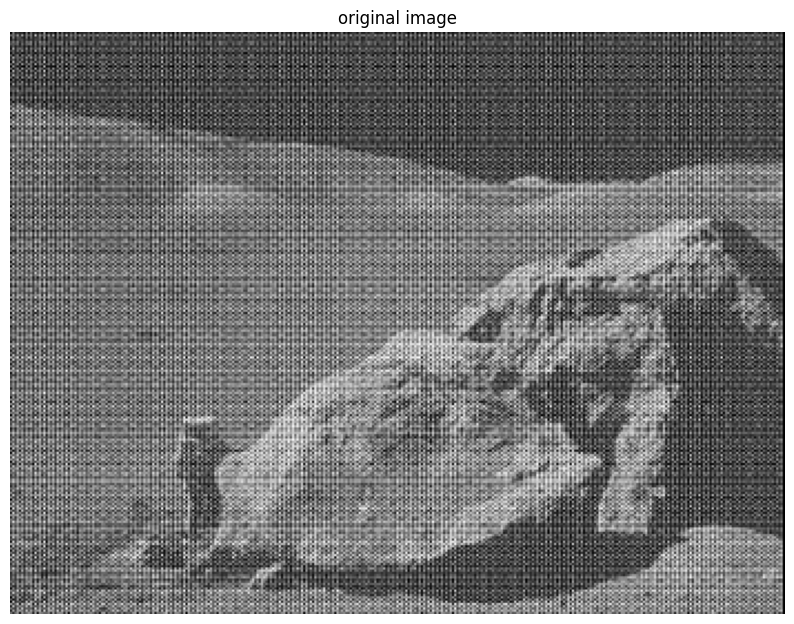

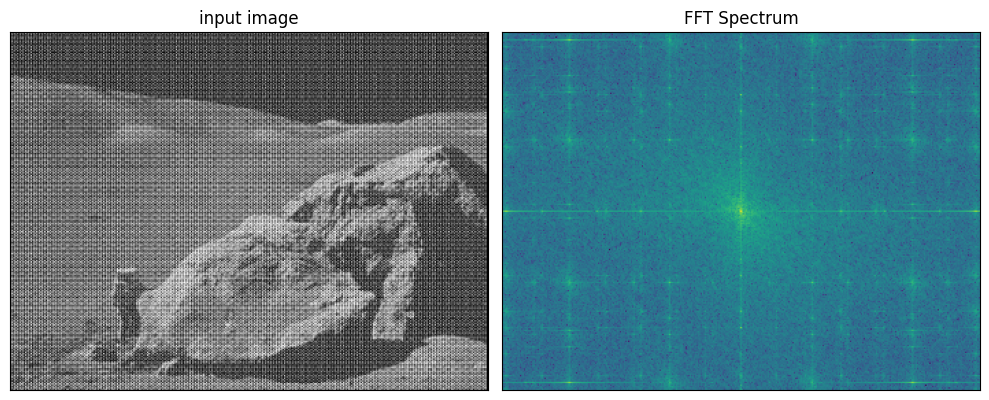

In [17]:
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# 添加项目根目录到路径
sys.path.append(os.path.abspath('../'))

# 导入任务3的模块
from src.task3_enhance import (
    enhance_image, 
    display_fft_spectrum, 
    apply_notch_filter,
    display_images
)
from src.utils.image_io import read_image, save_image

# 读取图像
image_path = "/home/hac/image/data/input/scenery.png"  # 根据实际路径调整
image = read_image(image_path)

# 显示原始图像
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.title('original image')
plt.axis('off')
plt.show()

# 显示FFT频谱，观察周期性噪声
magnitude_spectrum = display_fft_spectrum(image)

## notch滤波+CLAHE+锐化增强实验

### notch滤波

检测到的周期性噪声峰值数量: 150


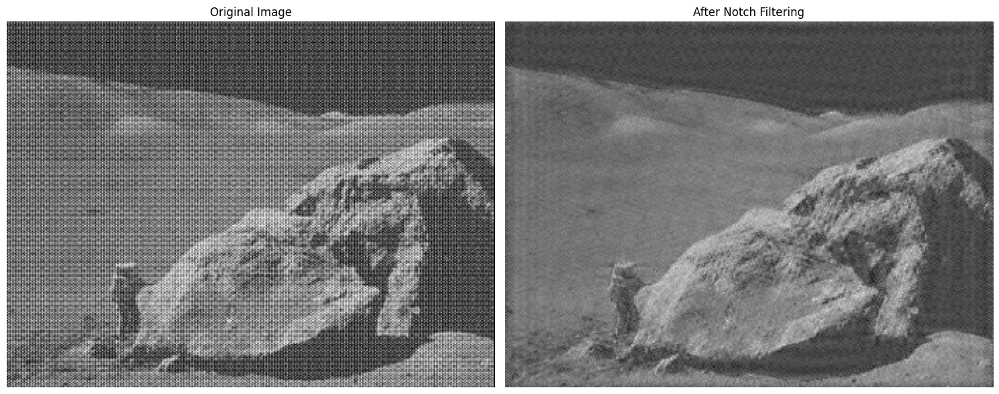

In [18]:
# 设置可调参数
threshold_factor = 0.2  # 噪声检测阈值
notch_radius = 8  # 陷波滤波器半径
max_peaks = 150
exclude_center_ratio = 0.1

# 先进行notch陷波滤波
from src.task3_enhance import detect_periodic_noise

# 检测周期性噪声峰值
peaks, magnitude_spectrum = detect_periodic_noise(image, 
                                                  threshold_factor=threshold_factor, 
                                                  max_peaks=max_peaks,
                                                  exclude_center_ratio=exclude_center_ratio)
print(f"检测到的周期性噪声峰值数量: {len(peaks)}")

# 应用notch陷波滤波去除周期性噪声
notch_filtered = apply_notch_filter(image, peaks, radius=notch_radius)

# 使用 display_images 显示原图和陷波滤波后图像对比，标题为英文
display_images([image, notch_filtered], ['Original Image', 'After Notch Filtering'])

### CLAHE

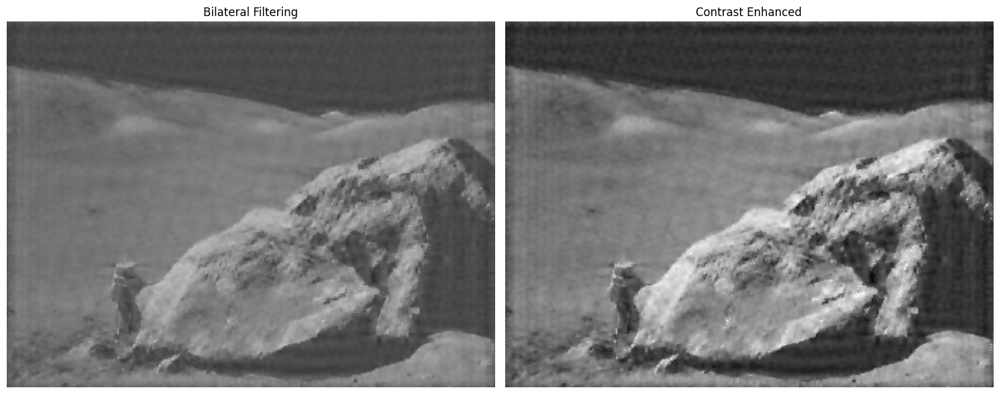

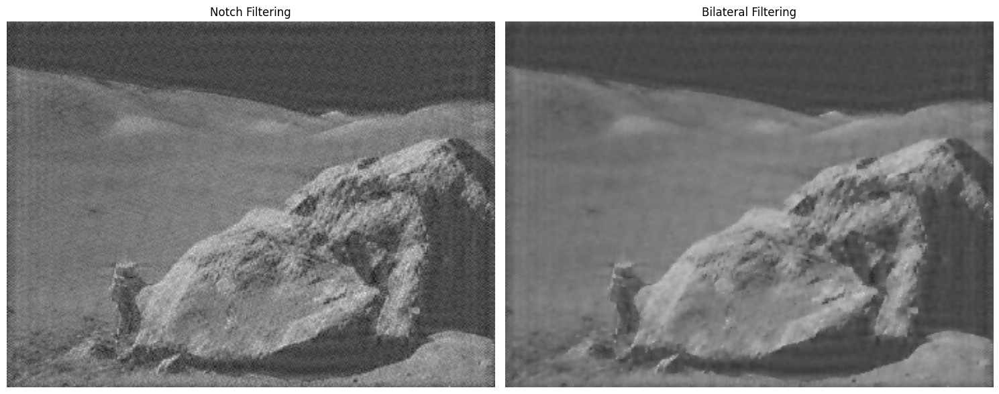

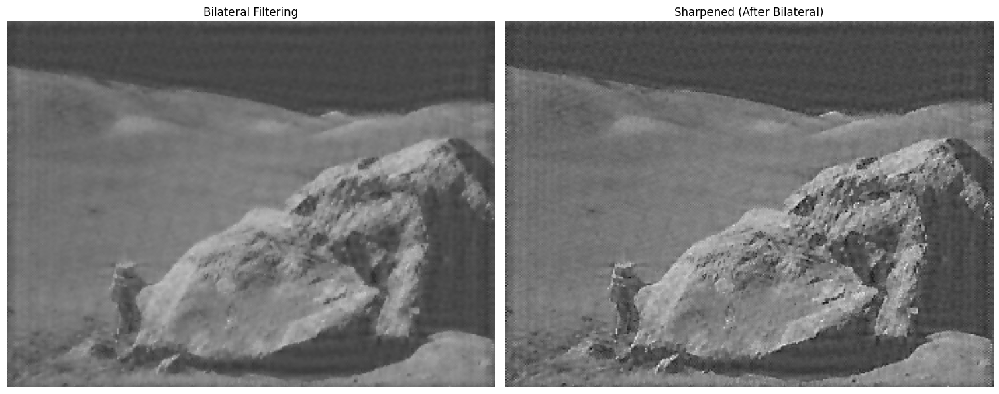

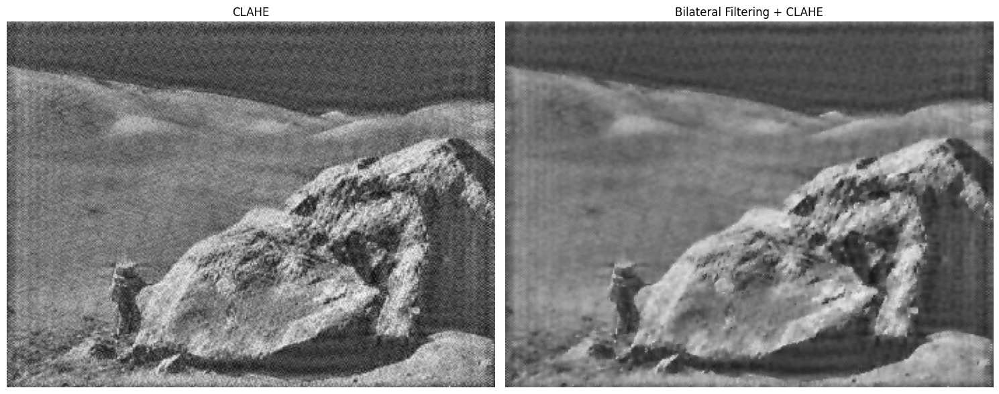

In [19]:
# 应用CLAHE增强对比度
from utils.filters import apply_clahe, bilateral_filter, unsharp_mask
from utils.color_space import adjust_contrast
clahe_clip_limit = 1.5
clahe_grid_size = (8, 8)

# 先对notch滤波后的图像进行双边滤波
bilateral_d = 4  # 双边滤波的直径
bilateral_sigma_color = 75  # 颜色空间的标准差
bilateral_sigma_space = 75  # 坐标空间的标准差

bilateral_filtered = bilateral_filter(notch_filtered, d=bilateral_d, sigma_color=bilateral_sigma_color, sigma_space=bilateral_sigma_space)

# 对双边滤波后的图像进行锐化
unsharp_strength = 1.5  # 锐化强度，可根据需要调整
sharpened_bilateral = unsharp_mask(bilateral_filtered, strength=unsharp_strength)

# 在双边滤波后增加对比度调整
contrast_factor = 1.6  # 对比度增强因子，可根据需要调整
contrast_enhanced = adjust_contrast(bilateral_filtered, factor=contrast_factor)
# 展示双边滤波与对比度增强后的对比
display_images([bilateral_filtered, contrast_enhanced], ['Bilateral Filtering', 'Contrast Enhanced'])


clahe_enhanced = apply_clahe(notch_filtered, clip_limit=clahe_clip_limit, tile_grid_size=clahe_grid_size)
clahe_bilter_enhanced = apply_clahe(bilateral_filtered, clip_limit=clahe_clip_limit, tile_grid_size=clahe_grid_size)

# 显示notch滤波 vs 双边滤波，双边滤波 vs CLAHE+双边滤波 两组对比
display_images([notch_filtered, bilateral_filtered], ['Notch Filtering', 'Bilateral Filtering'])
# 展示锐化效果
display_images([bilateral_filtered, sharpened_bilateral], ['Bilateral Filtering', 'Sharpened (After Bilateral)'])


display_images([clahe_enhanced, clahe_bilter_enhanced], ['CLAHE', 'Bilateral Filtering + CLAHE'])

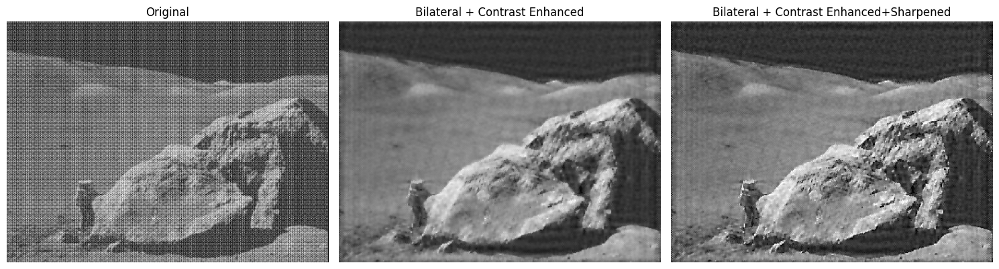

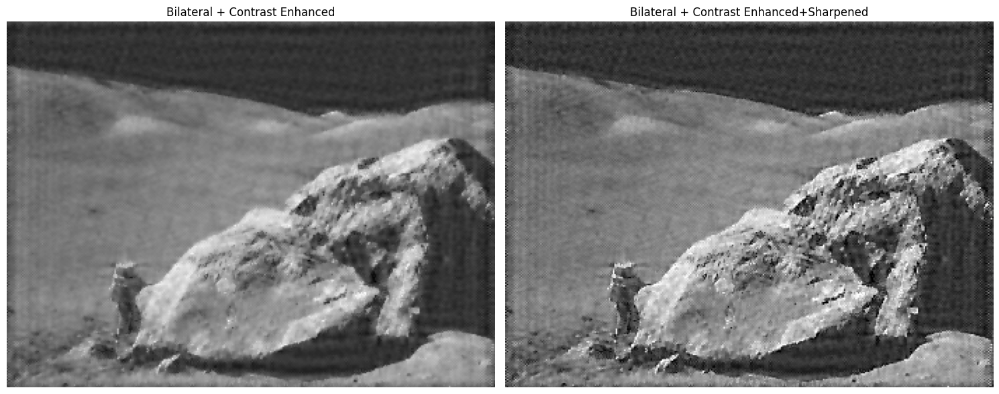

In [24]:
sharpened_contrast_bilateral = unsharp_mask(contrast_enhanced, kernel_size=5, strength=1.5)
display_images([image, contrast_enhanced, sharpened_contrast_bilateral], ['Original', 'Bilateral + Contrast Enhanced', 'Bilateral + Contrast Enhanced+Sharpened'], figsize=(15, 10))
display_images([contrast_enhanced, sharpened_contrast_bilateral], ['Bilateral + Contrast Enhanced', 'Bilateral + Contrast Enhanced+Sharpened'], figsize=(15, 10))

In [21]:
# 保存增强后的图像
from src.config import ENHANCED_OUTPUT_PATH
save_image(sharpened_contrast_bilateral, ENHANCED_OUTPUT_PATH)

图像已保存至: /home/hac/image/data/output/enhanced_scenery.png


# 任务4：机动务车车号定位（用矩形框框出车编号），不需要识别

In [22]:
import os
import matplotlib.pyplot as plt # 尽管不再直接用于显示，但保留以防万一或作为参考
import cv2 # 导入cv2用于图像显示（display_image内部使用）

# Jupyter Notebook 中不能用 from ../src.xxx 导入模块
# 推荐方法如下：

import sys
sys.path.append(os.path.abspath('../'))

from src.task4_locate import locate_vehicle_number
from src.utils.image_io import read_image, display_image  # read_image用于在Notebook中直接读取和显示原始图像，尽管locate_vehicle_number内部也读取了

# 定义输入图片路径
input_image_paths = [
    "../data/input/vehicle1.png",
    "../data/input/vehicle2.png",
    "../data/input/vehicle3.png",
    "../data/input/vehicle4.png",
]

# 定义输出目录，确保它存在
output_directory = "../data/output"
os.makedirs(output_directory, exist_ok=True)

print(f"检测结果将保存到: {output_directory}")

for idx, img_path in enumerate(input_image_paths):
    img = read_image(img_path)
    print(f"第{idx+1}张图像（{os.path.basename(img_path)}）像素尺寸: {img.shape}")  # HWC格式，(高, 宽, 通道数)


检测结果将保存到: ../data/output
第1张图像（vehicle1.png）像素尺寸: (186, 349, 3)
第2张图像（vehicle2.png）像素尺寸: (389, 347, 3)
第3张图像（vehicle3.png）像素尺寸: (397, 353, 3)
第4张图像（vehicle4.png）像素尺寸: (417, 372, 3)



--- 处理图像: vehicle1.png ---


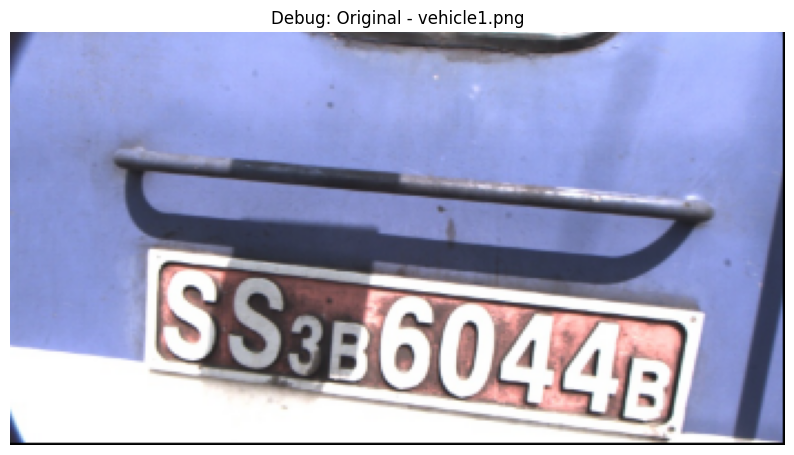

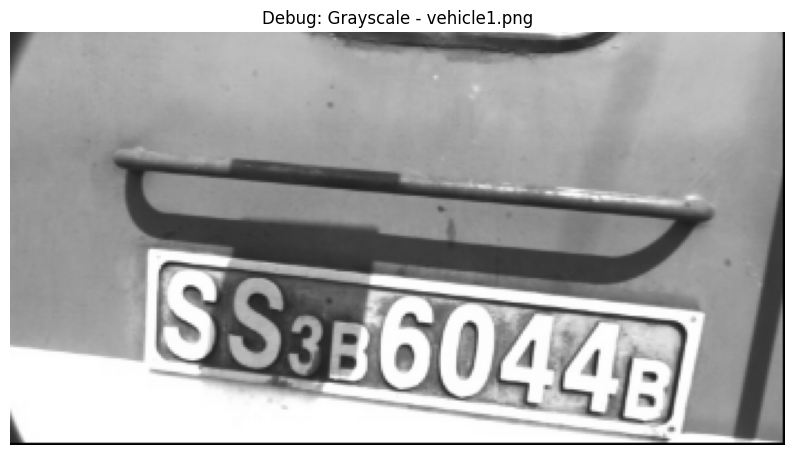

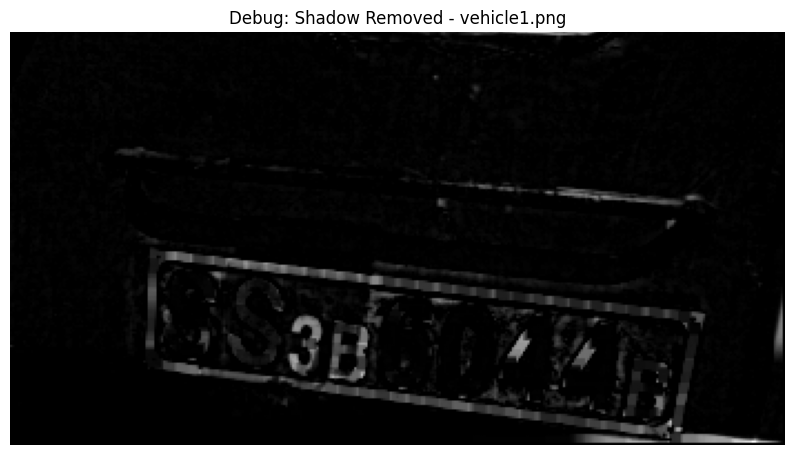

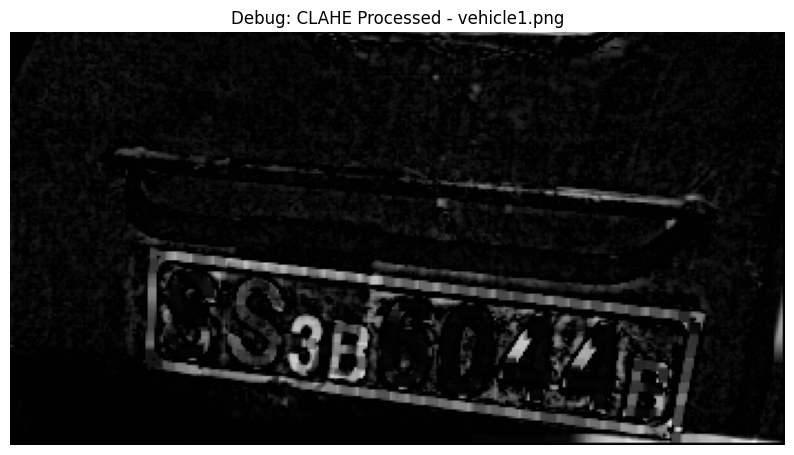

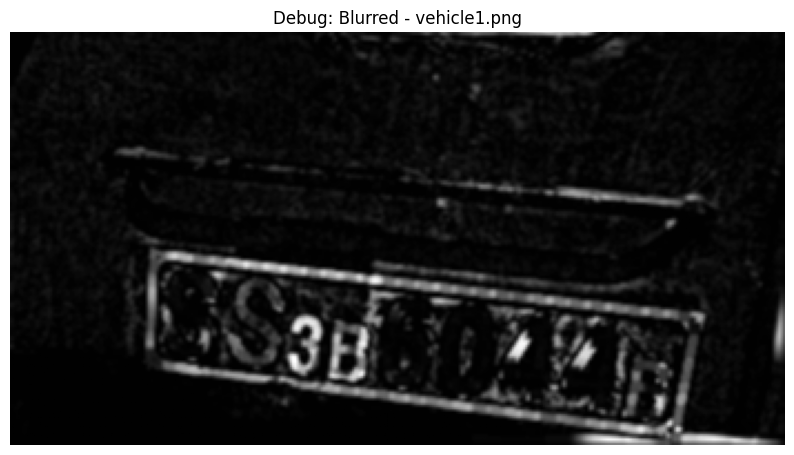

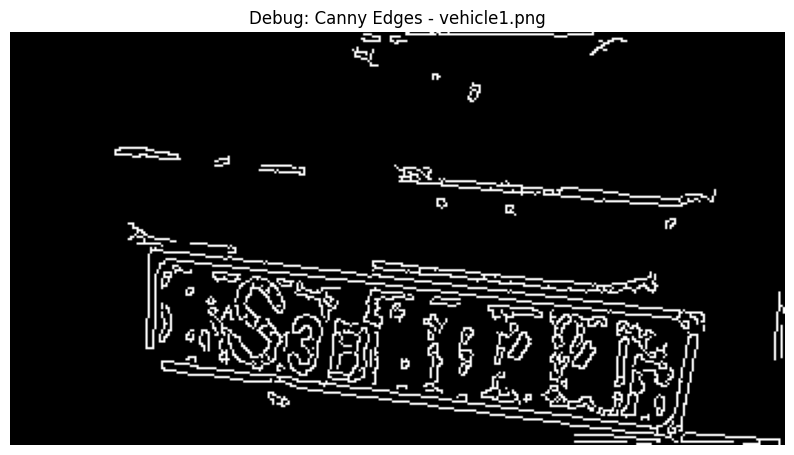

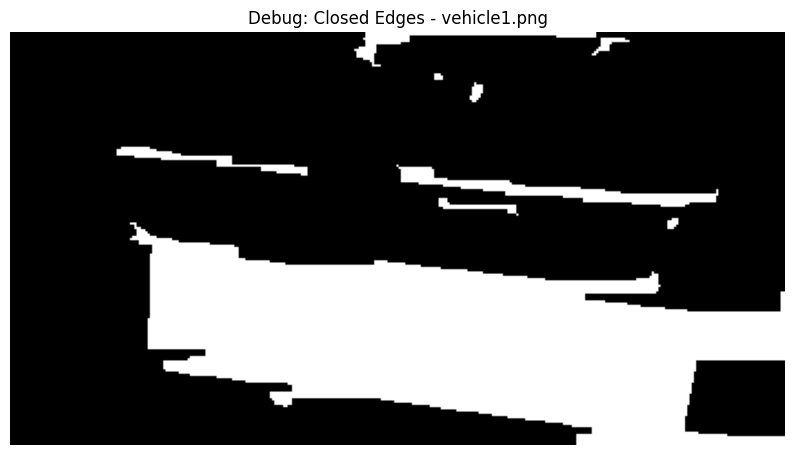

图像已保存至: ../data/output/vehicle1_detected.png
检测结果已保存到: ../data/output/vehicle1_detected.png
显示图像: vehicle1.png


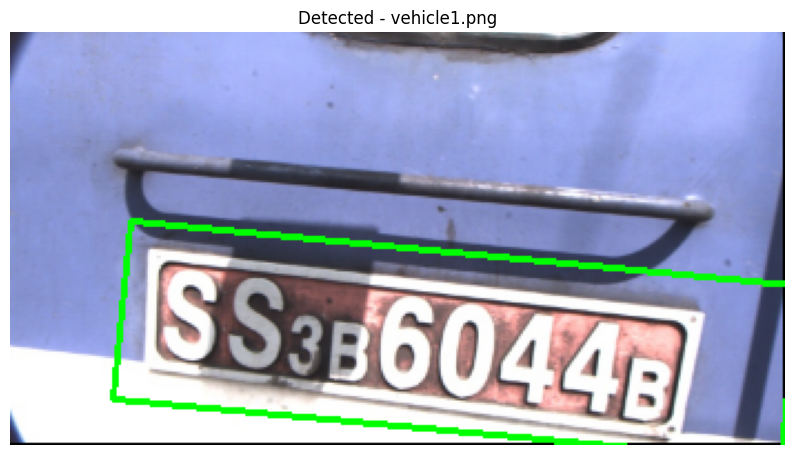


--- 处理图像: vehicle2.png ---


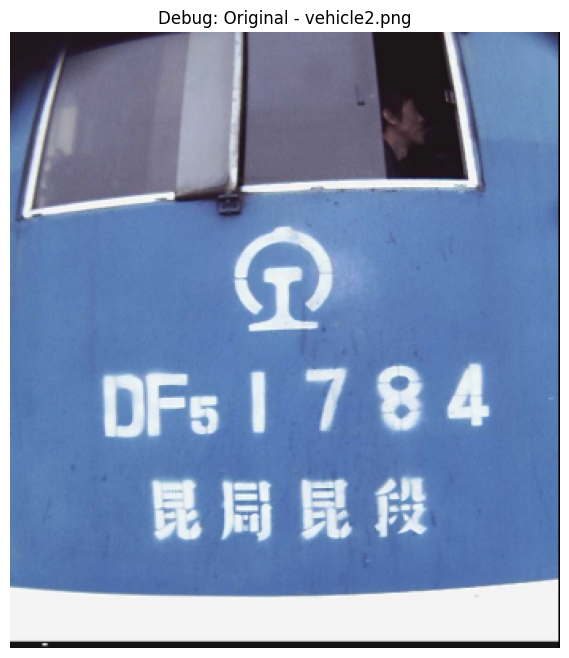

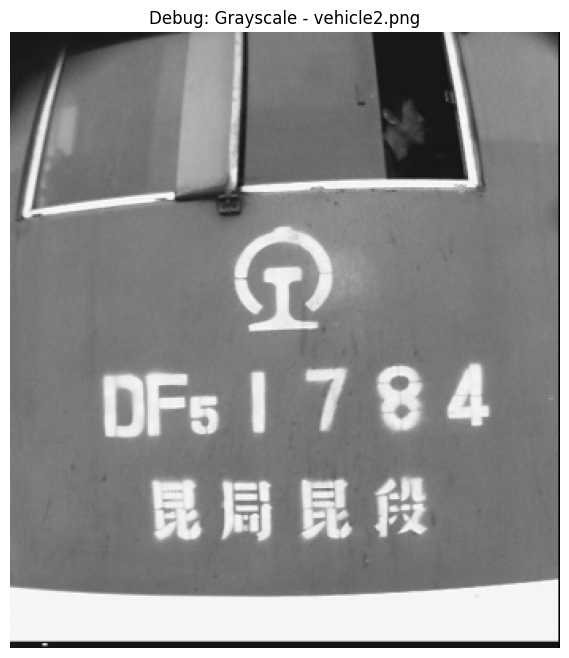

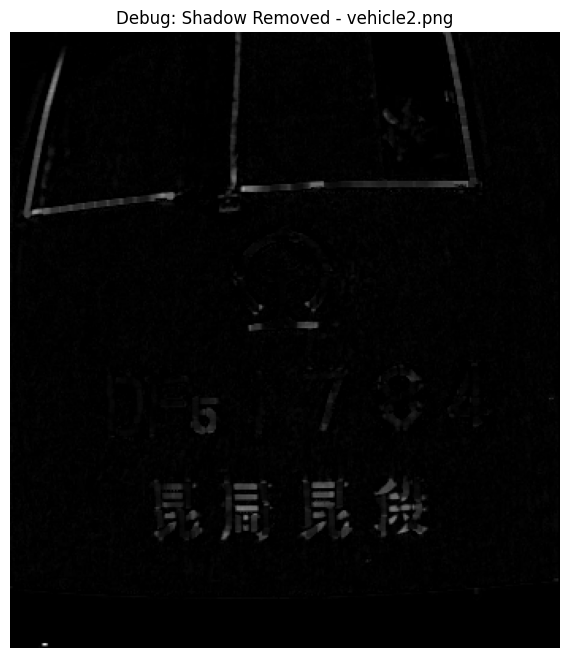

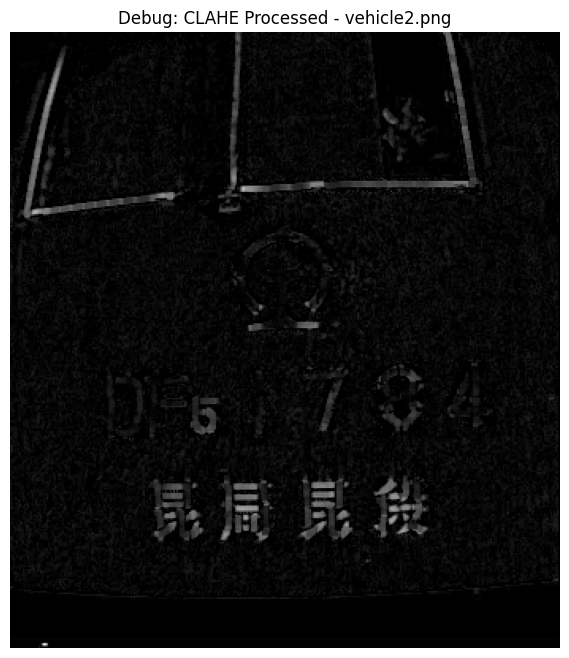

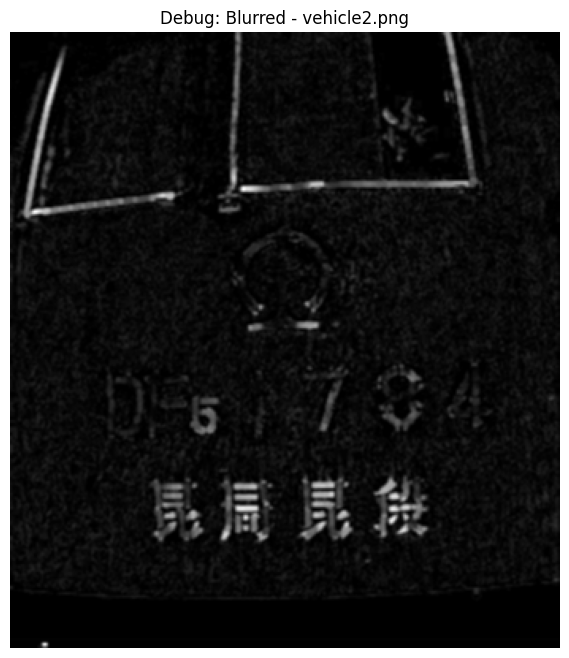

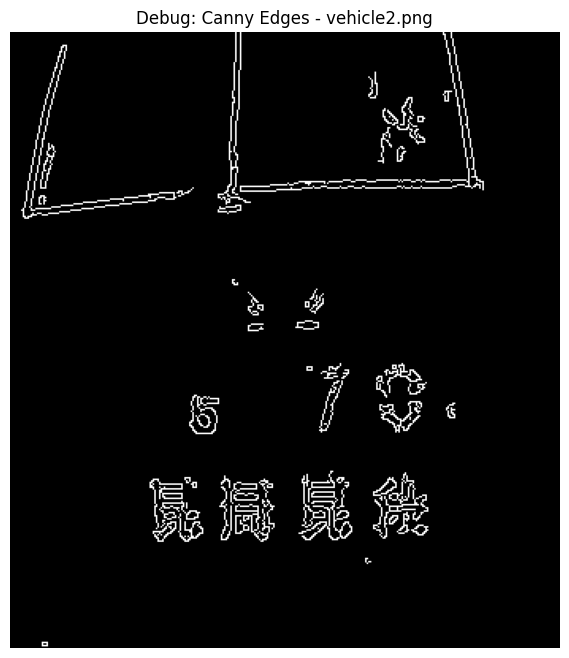

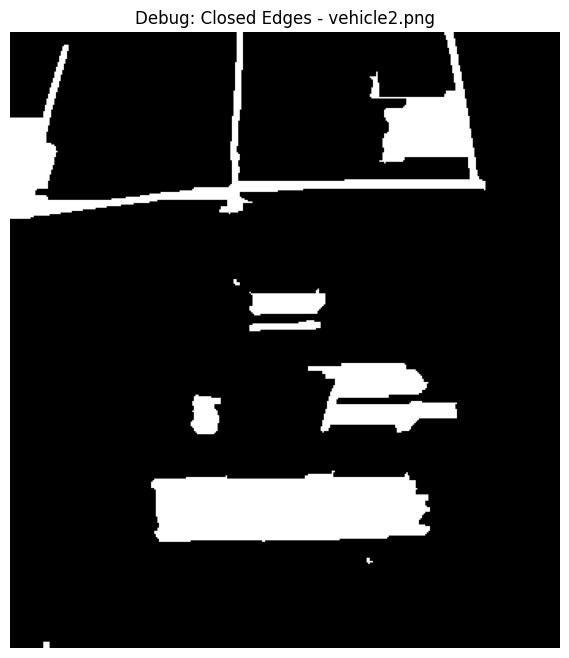

图像已保存至: ../data/output/vehicle2_detected.png
检测结果已保存到: ../data/output/vehicle2_detected.png
显示图像: vehicle2.png


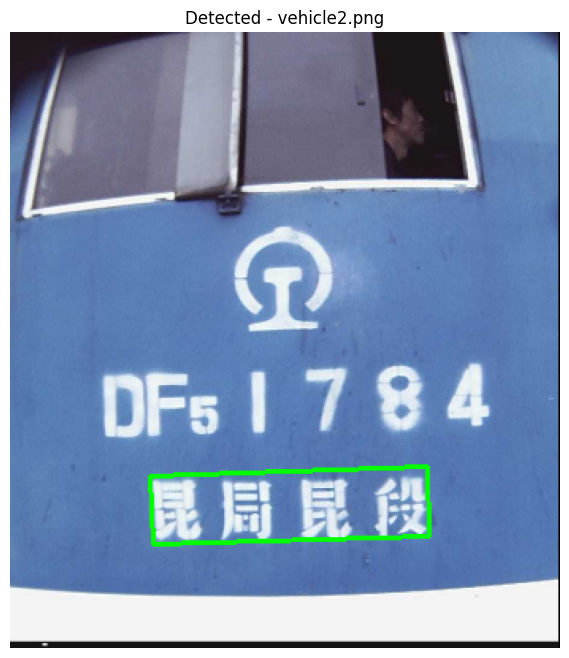


--- 处理图像: vehicle3.png ---


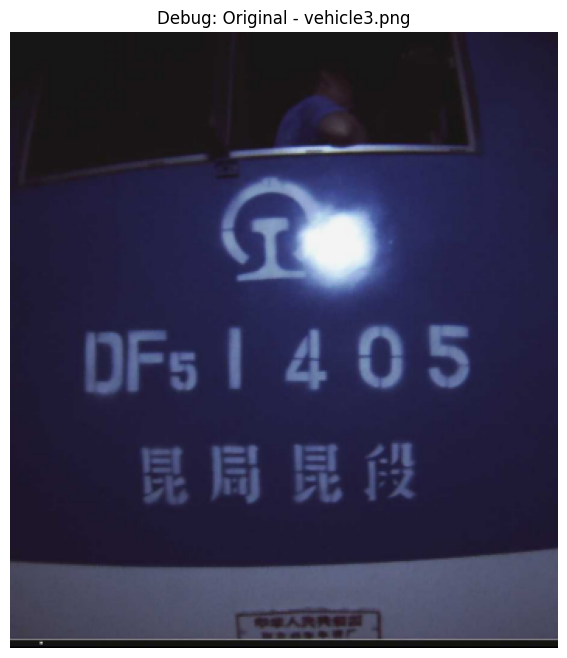

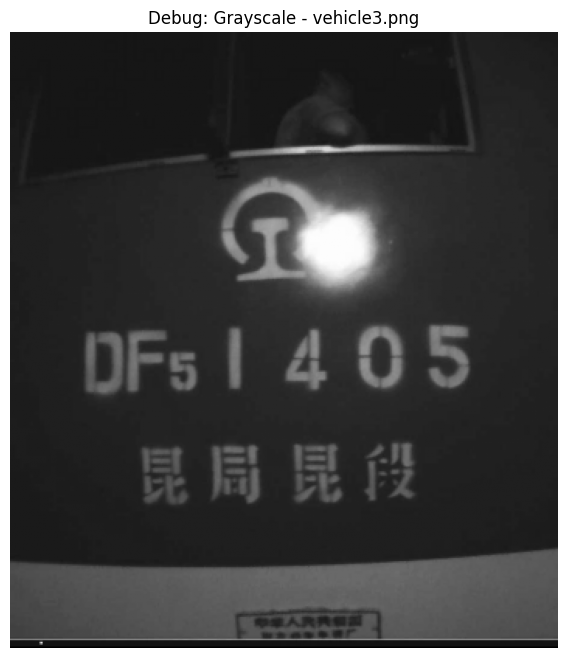

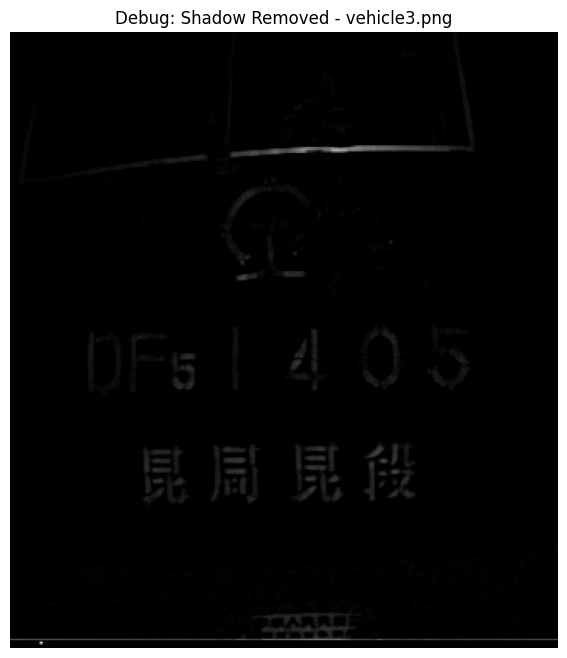

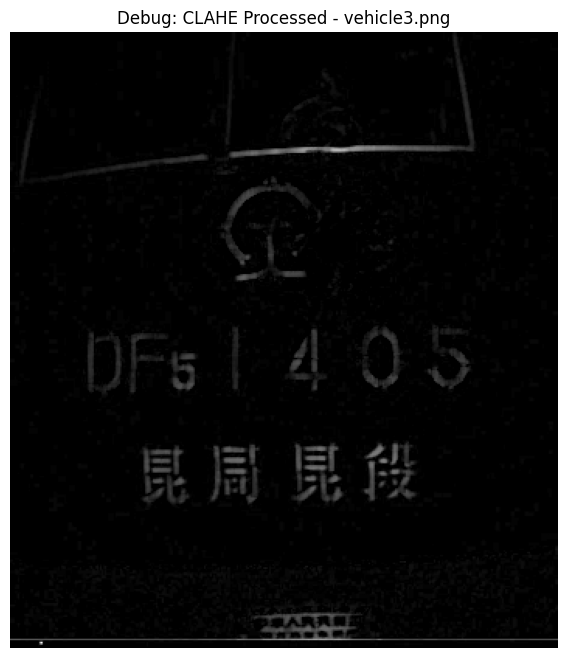

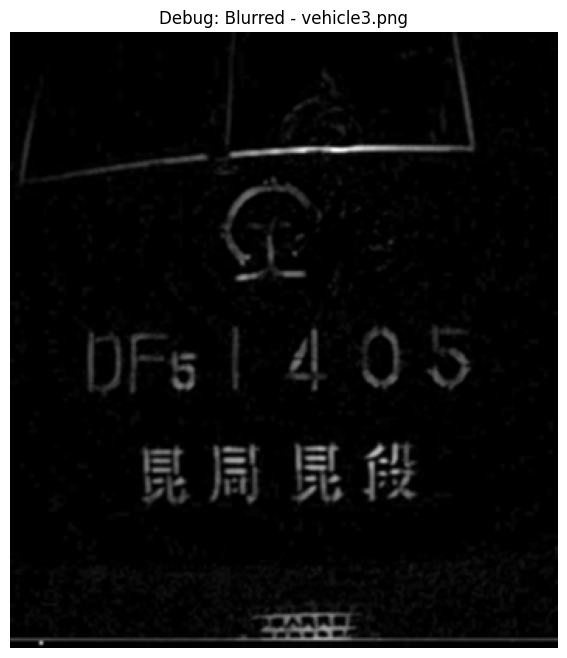

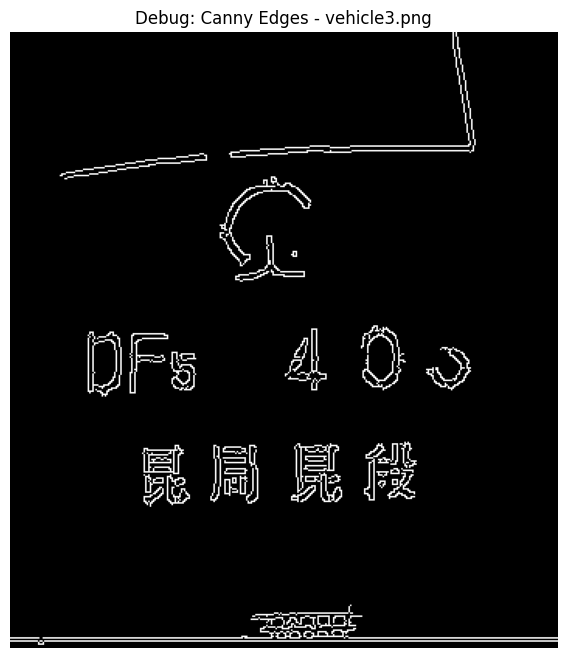

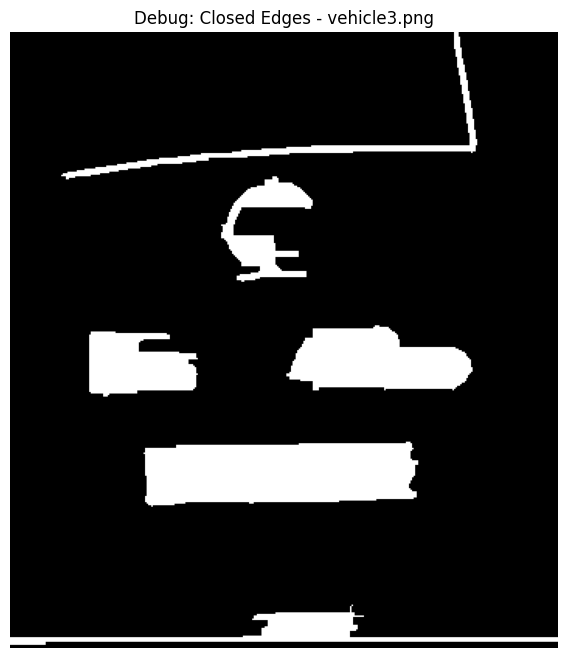

图像已保存至: ../data/output/vehicle3_detected.png
检测结果已保存到: ../data/output/vehicle3_detected.png
显示图像: vehicle3.png


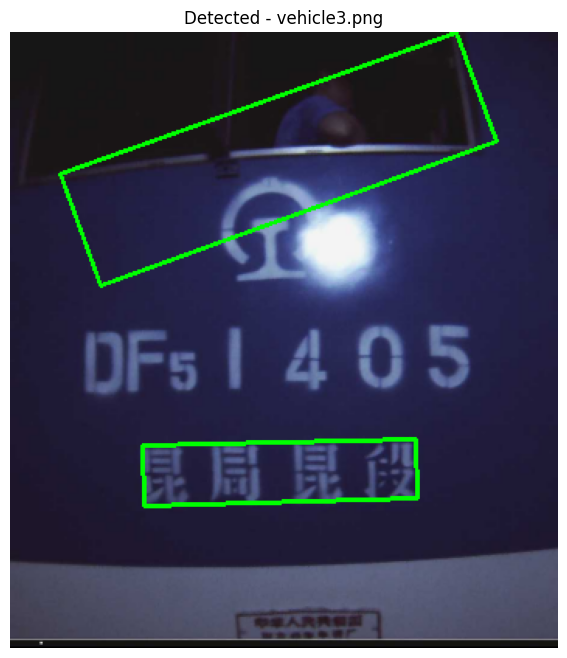


--- 处理图像: vehicle4.png ---


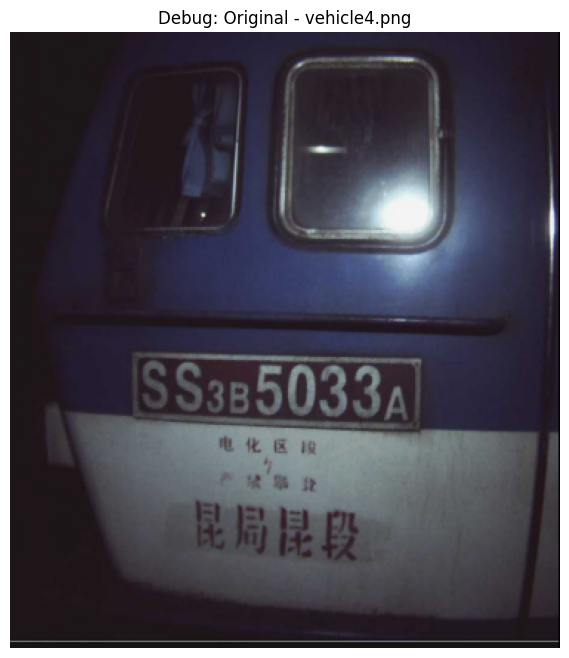

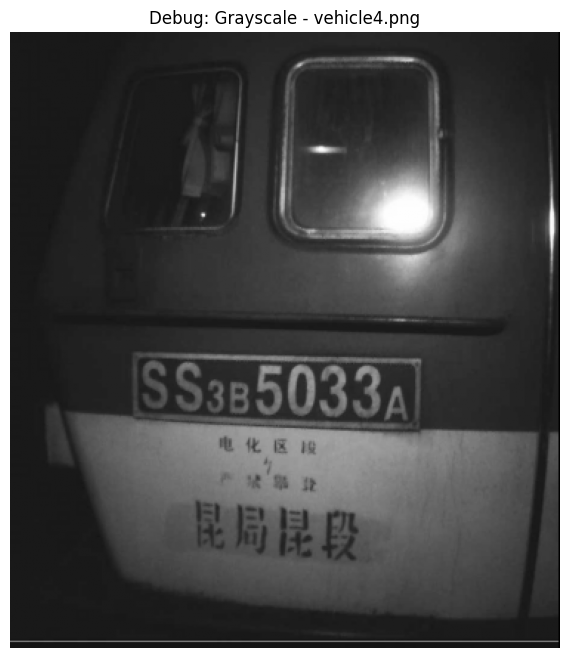

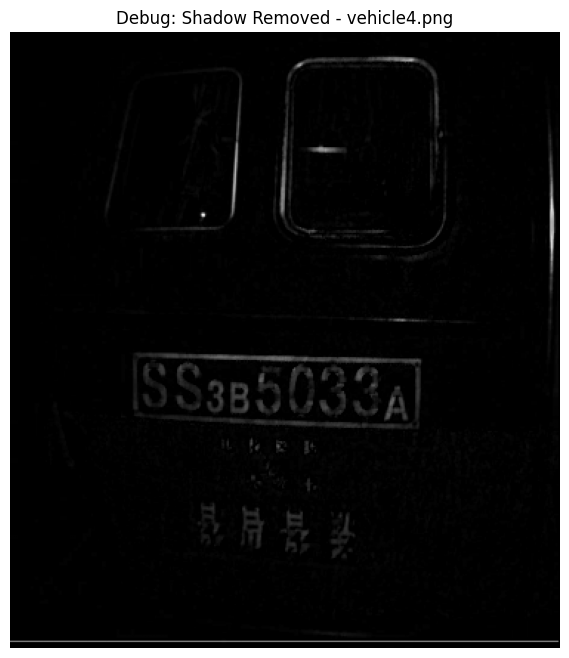

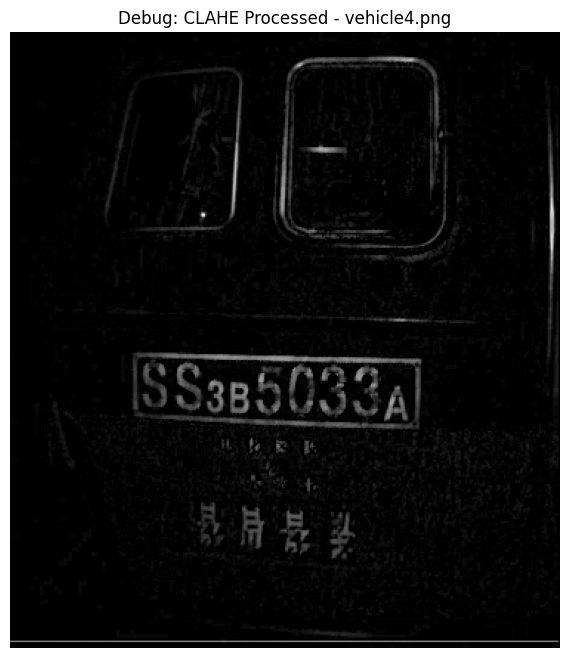

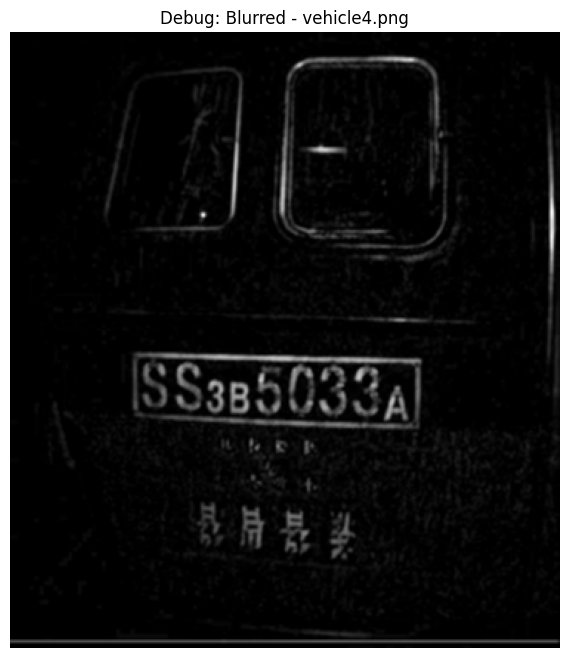

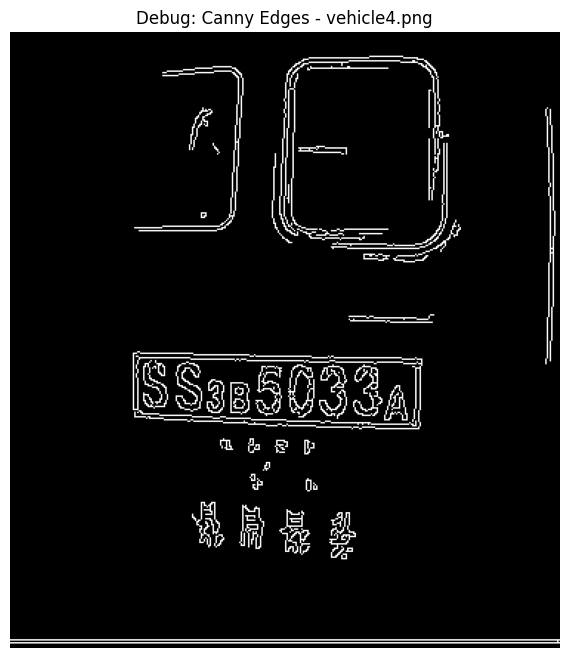

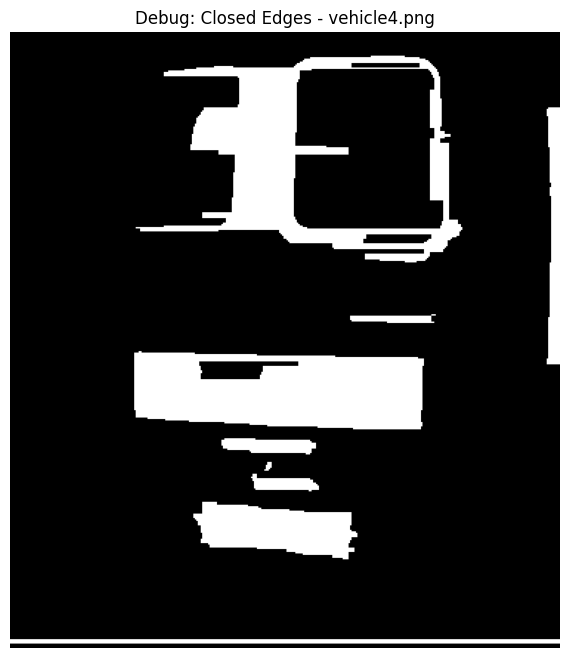

图像已保存至: ../data/output/vehicle4_detected.png
检测结果已保存到: ../data/output/vehicle4_detected.png
显示图像: vehicle4.png


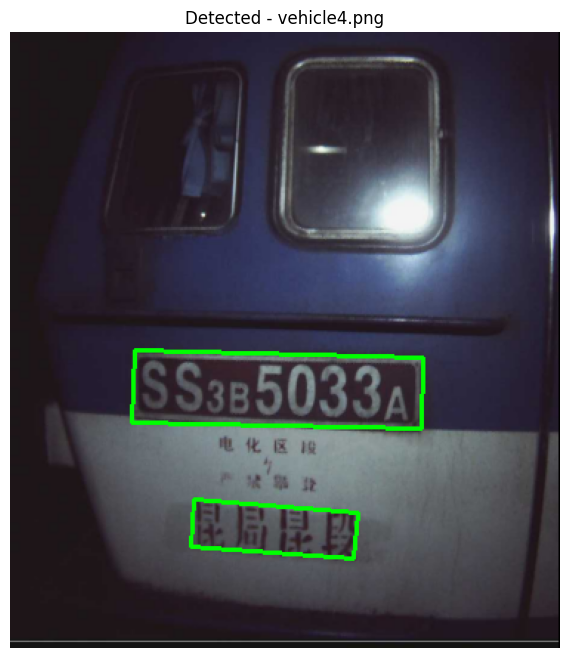


所有图像处理完毕。
你可以继续在 Notebook 中的 'detection_params' 字典中调整参数，以优化检测效果。
特别是对于 `vehicle2.png` 和 `vehicle3.png` 这种没有外框的图片，形态学闭运算的核大小和轮廓筛选的参数调整会更关键。


In [26]:
# --- 可调参数区域 ---
# 你可以在这里调整这些参数，然后重新运行单元格观察效果
from re import T


detection_params = {
   "gaussian_kernel_size": 3,
    "canny_low_threshold": 50,
    "canny_high_threshold": 150,
    "morph_kernel_width": 40,       # 在阴影去除后，可以尝试更大的宽度，连接水平字符
    "morph_kernel_height": 3,       # 适当调整高度
    "min_contour_area": 1000,
    "max_contour_area": 40000,
    "min_aspect_ratio": 3.5,        # 角度校正后，长宽比应该更接近实际车牌
    "max_aspect_ratio": 7,
    "apply_clahe_preprocess": True,      # 继续启用CLAHE，与阴影去除配合使用
    "clahe_clip_limit": 3.0,
    "clahe_tile_grid_size": (8, 8),
    "enable_angle_correction": False,     # 确保角度校正启用！
    "angle_correction_threshold": 5,
    "min_rect_height_for_angle_correction": 30,
    "debug_mode": True,
    "apply_shadow_removal": True,       # <-- **关键：启用阴影去除**
    "shadow_kernel_size": (5, 5)      # <-- **关键：阴影去除核大小，可以调整**
}
# --- 可调参数区域结束 ---

# 遍历每张图片进行处理和显示
for img_path in input_image_paths:
    print(f"\n--- 处理图像: {os.path.basename(img_path)} ---")

    # 调用定位函数，传入可调参数，并保存结果
    # save_results=True 会将带框的图像保存到 data/output 目录下
    result_image_rgb = locate_vehicle_number(
        image_path=img_path,
        save_results=True,
        output_dir=output_directory,
        **detection_params # 使用字典解包传入参数
    )

    # 在Jupyter Notebook中显示结果，使用 display_image
    print(f"显示图像: {os.path.basename(img_path)}")
    display_image(result_image_rgb, title=f"Detected - {os.path.basename(img_path)}")

print("\n所有图像处理完毕。")
print("你可以继续在 Notebook 中的 \'detection_params\' 字典中调整参数，以优化检测效果。")
print("特别是对于 `vehicle2.png` 和 `vehicle3.png` 这种没有外框的图片，形态学闭运算的核大小和轮廓筛选的参数调整会更关键。")